# Problem 5

### prepare dataset I

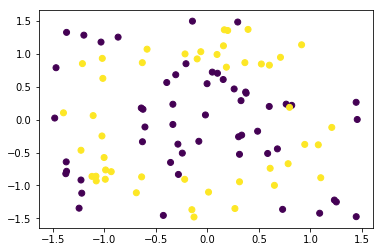

In [95]:
import numpy as np
import matplotlib.pyplot as plt

def dataseti(n=100):
    np.random.seed(seed=32)
    X = 3 * (np.random.rand(n, 2) -0.5)
    radius = X[:, 0]**2 + X[:, 1]**2
    y = 2 * ((radius > (0.7 + 0.1* np.random.randn(n))) & (radius < (2.2 + 0.1 * np.random.randn(n)))) -1
    plt.scatter(X[:, 0], X[:, 1], c=y)
    return X, y
_ = dataseti()


In [65]:
len(set(np.random.choice(np.arange(len(y)), 100, replace=False)))

100

iteration stop at 9850


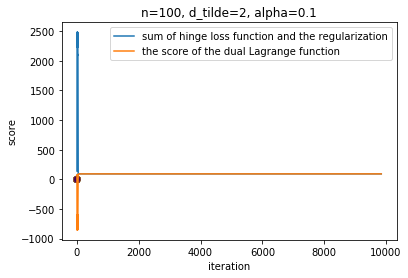

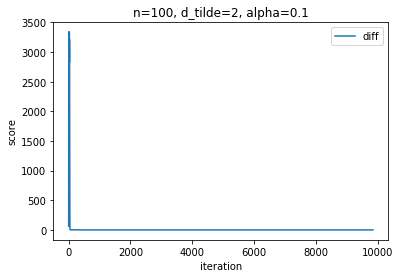

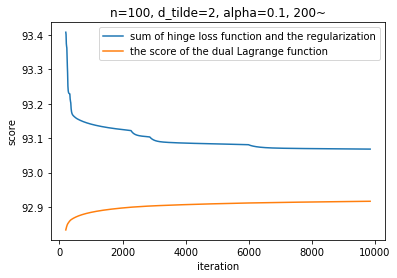

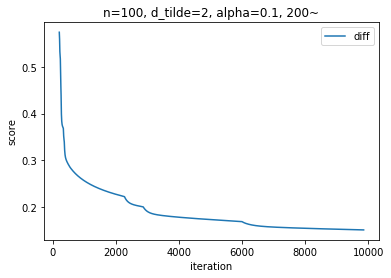

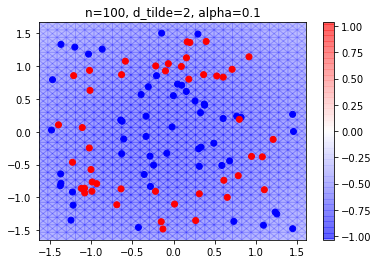

...

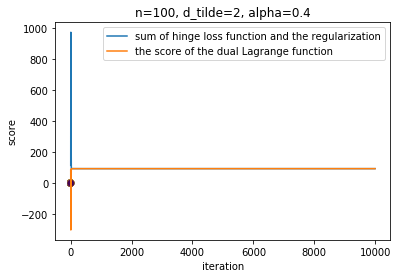

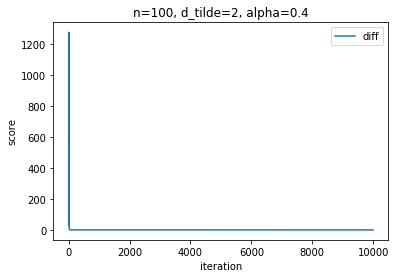

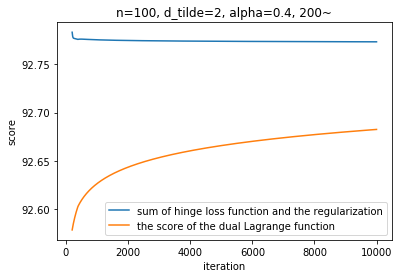

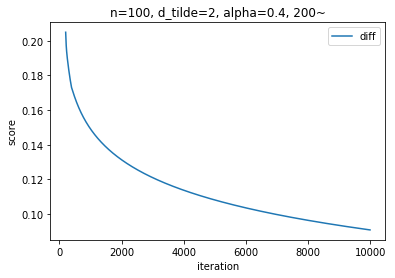

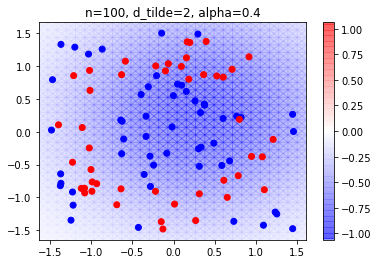

iteration stop at 7493


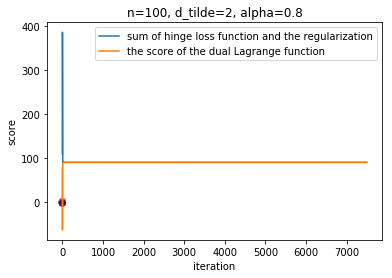

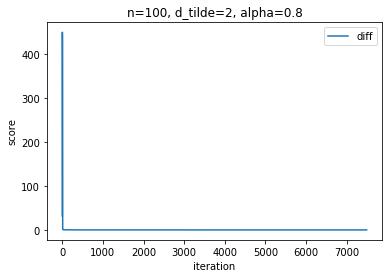

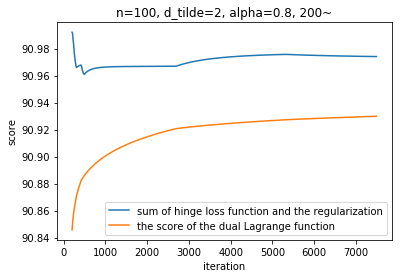

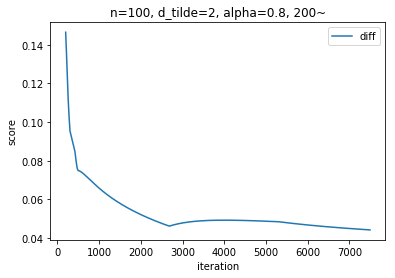

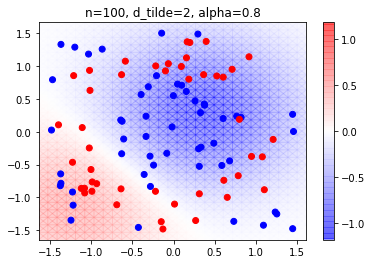

iteration stop at 8894


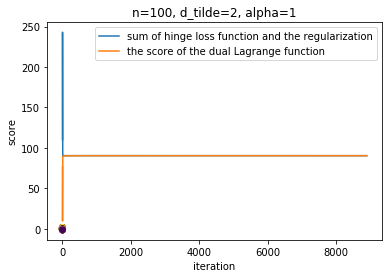

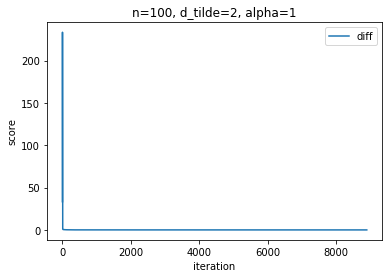

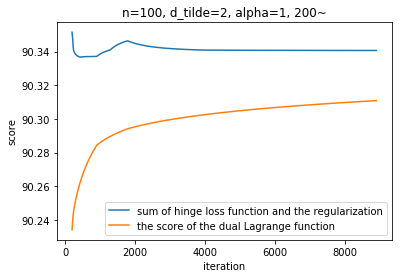

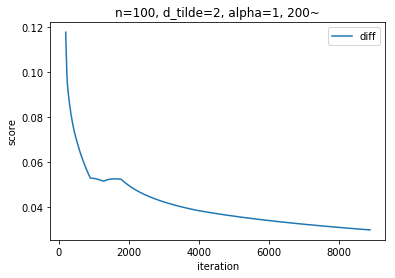

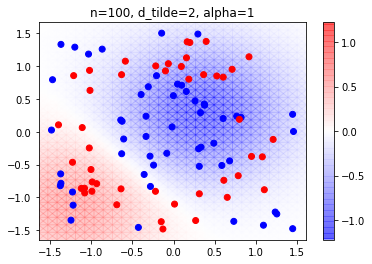

...

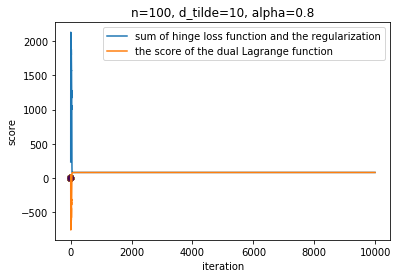

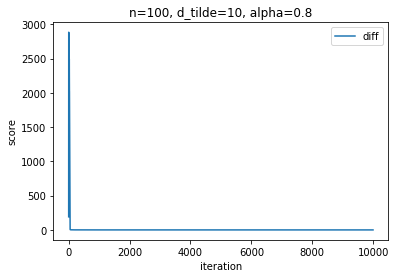

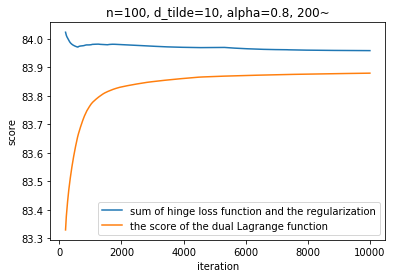

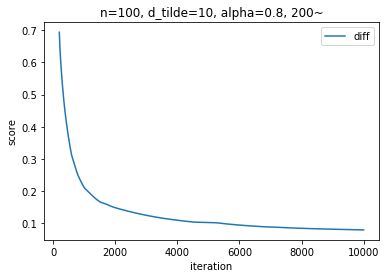

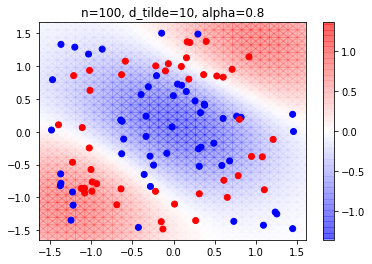

iteration stop at 8869


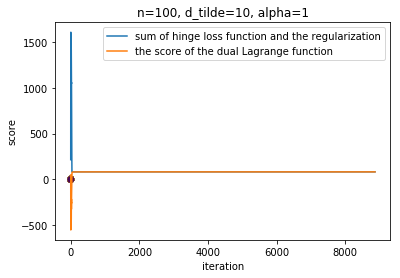

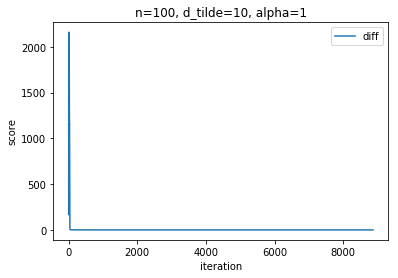

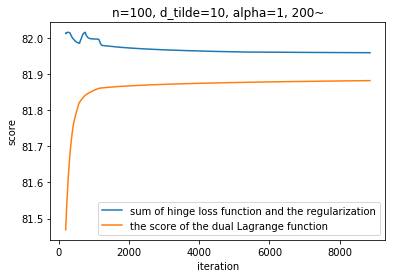

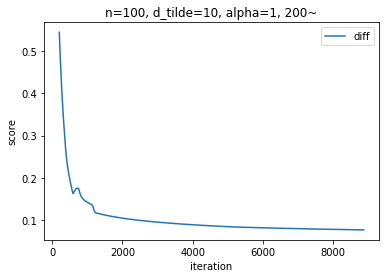

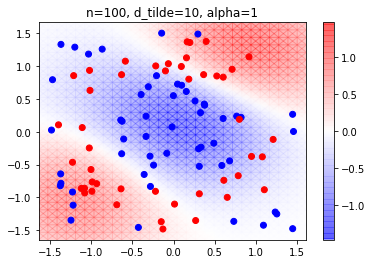

...

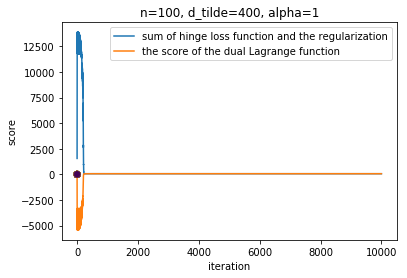

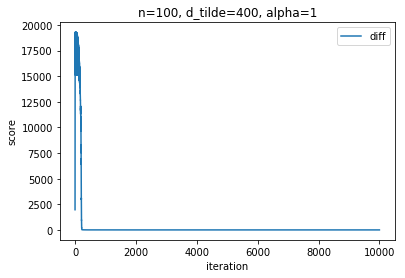

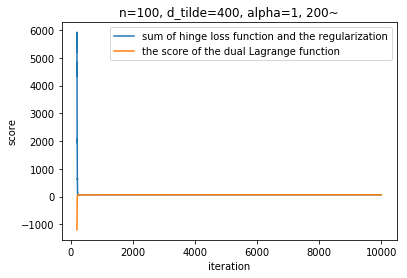

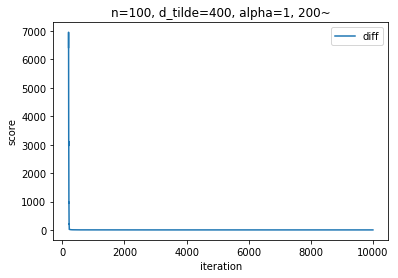

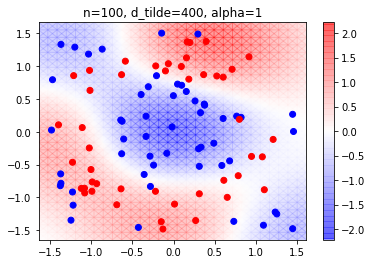

iteration stop at 1


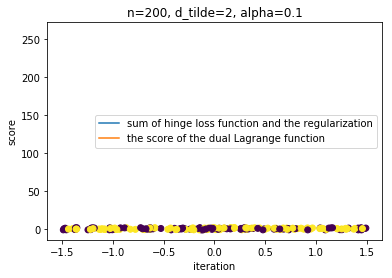

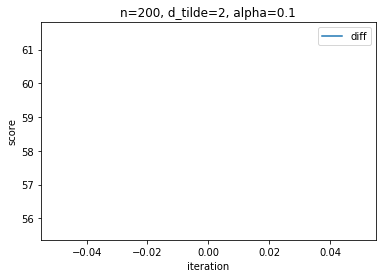

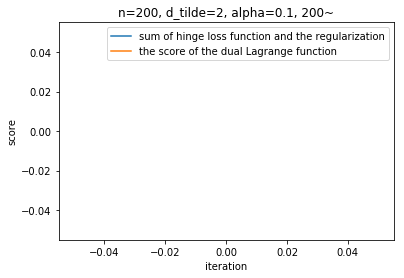

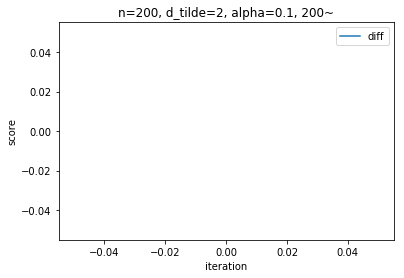

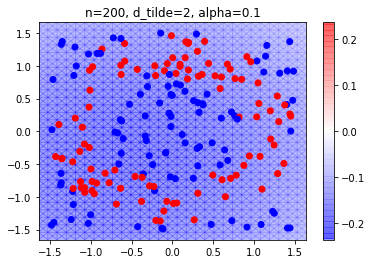

iteration stop at 1


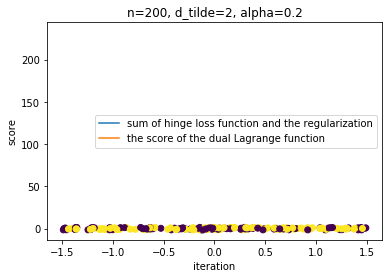

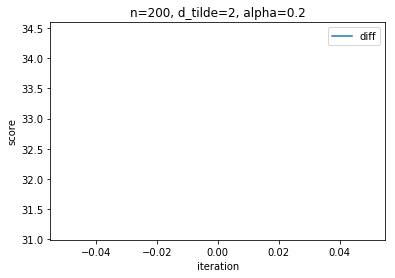

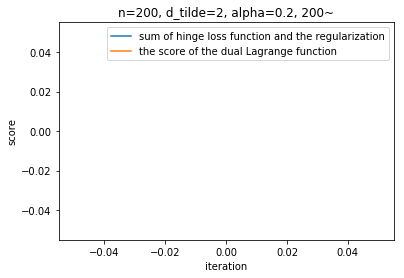

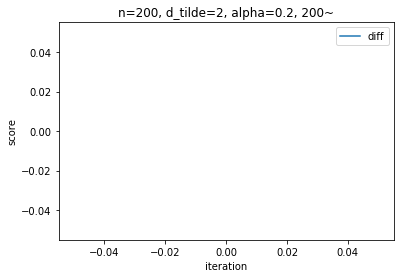

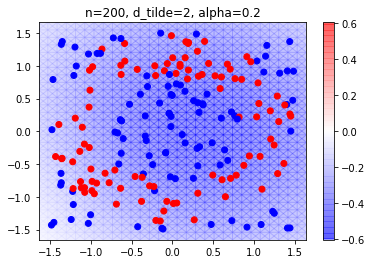

iteration stop at 6273


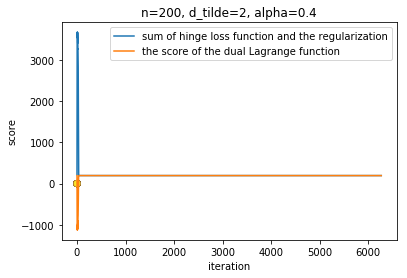

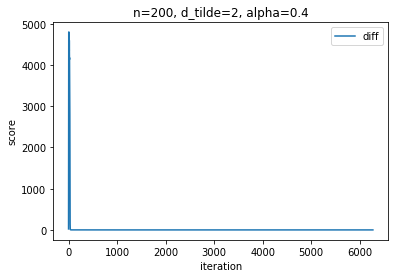

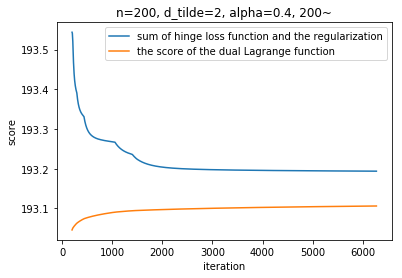

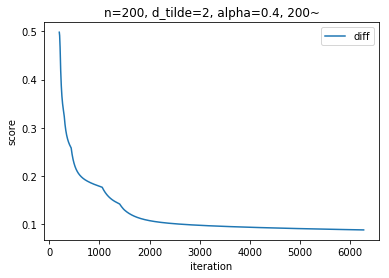

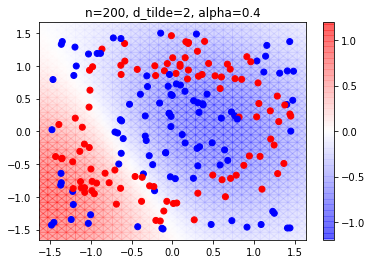

...

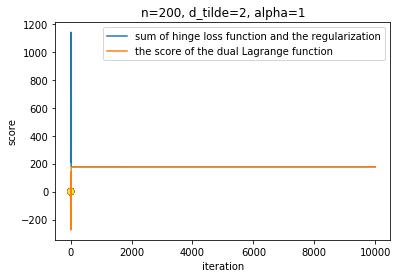

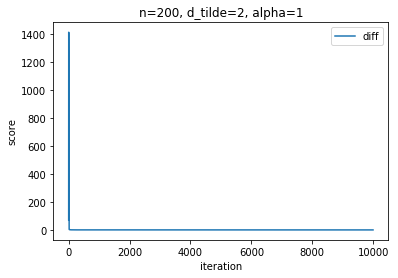

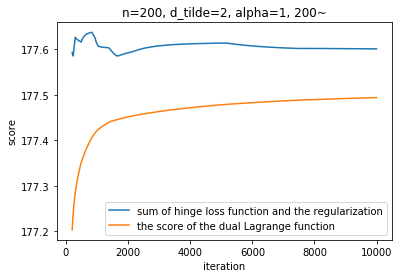

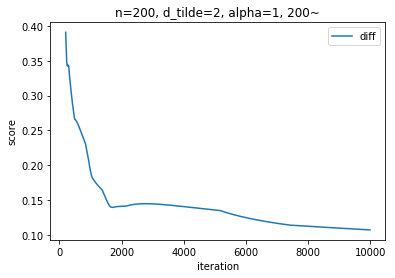

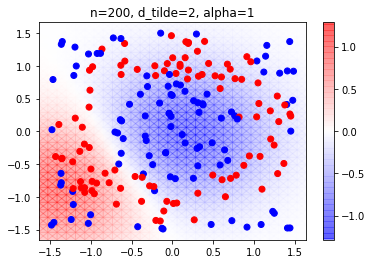

iteration stop at 1


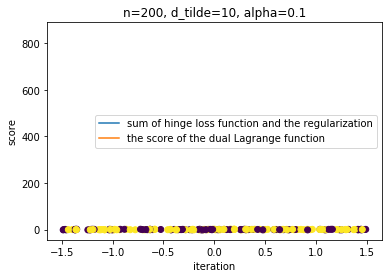

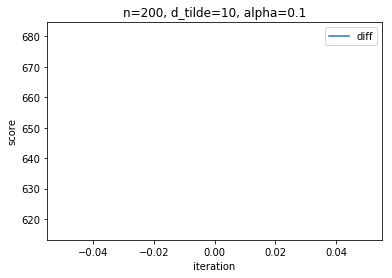

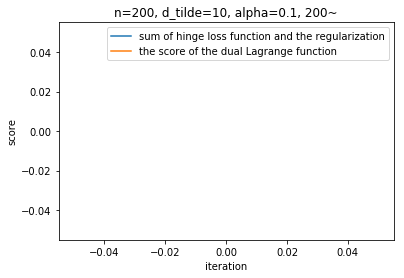

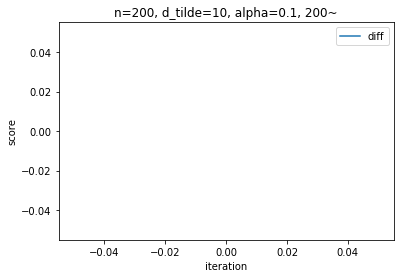

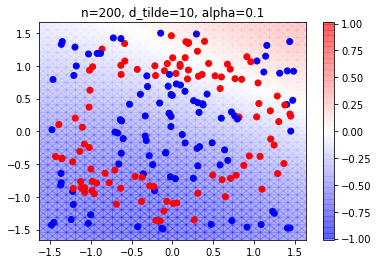

iteration stop at 1919


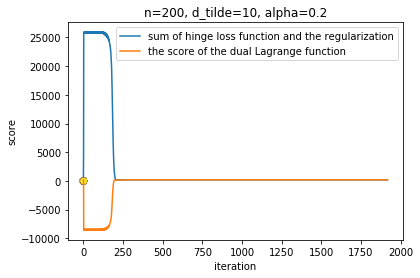

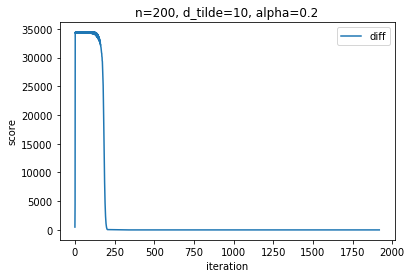

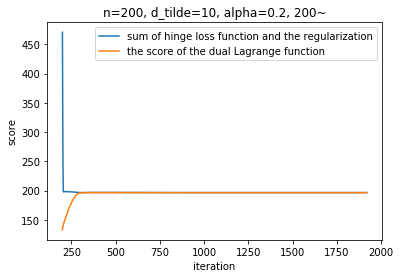

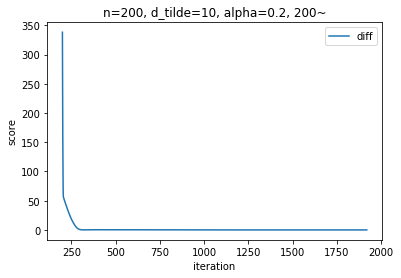

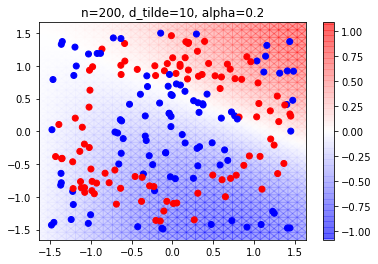

...

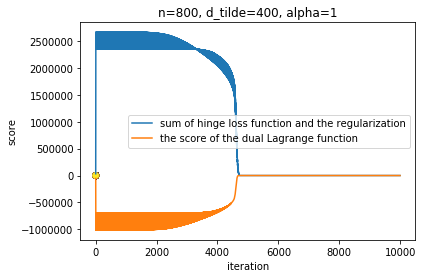

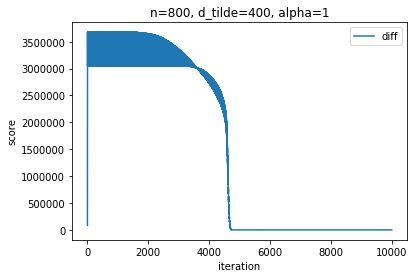

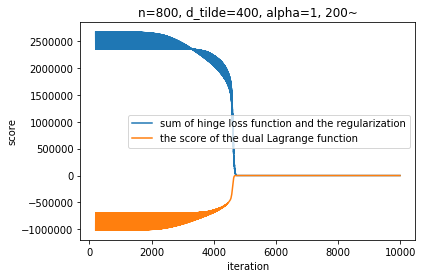

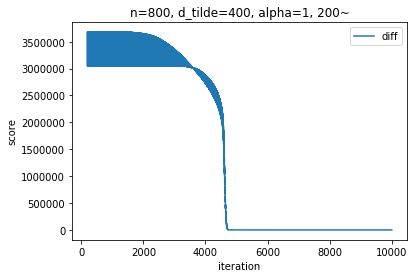

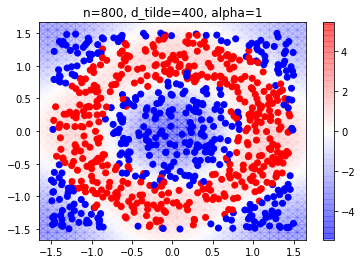

In [115]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import os

class KernelSVM:
    def __init__(self, X, y, lam=1, alpha=0.6, d_tilde=100):
        """
        input
            X: array (#item, #feature)
            y: list (#item)
        """
        self.alpha = alpha
        self.X = X
        d_tilde = min(d_tilde, len(X))
        self.pivots_idx =  np.random.choice(np.arange(X.shape[0]), d_tilde, replace=False)
        pivots = X[self.pivots_idx]
        self.fai_X = np.exp(-self.alpha*(np.sum(X*X, axis=1).reshape([-1,1])-2*X@pivots.T + np.sum(pivots*pivots, axis=1).reshape([1,-1])))
        self.Y = np.diag(y)
        self.K = (self.fai_X.T @ self.Y).T @ (self.fai_X.T @ self.Y)
        self.lam = lam
        self.w = np.ones(self.fai_X.shape[1])
        self.a = np.ones(self.fai_X.shape[0])
    
    def primal_function(self):
        "主問題の目的関数"
        loss = np.clip(1 - (self.w.T@self.fai_X.T@self.Y), 0, None)
        return np.sum(loss) + self.lam * self.w@self.w

    def dual_Lagrange_function(self):
        "双対問題の目的関数"
        return - 1/(4 * self.lam) * self.a.T@self.K@self.a + np.sum(self.a)

    def update_w_from_a(self):
        self.w = 1/(2 * self.lam) * self.fai_X.T@self.Y@self.a

    def projected_gradient_descent(self, eps=1e-6, max_itr=10000, eta=lambda t:1/(1+t)):
        n, d = self.fai_X.shape
        pre = - np.inf
        dual_log = []
        primal_log = []
        for itr in range(max_itr):
            now = self.dual_Lagrange_function()
            dual_log.append((itr, now))
            primal_log.append((itr, self.primal_function()))
            if(abs(now-pre) < eps):
                print(f"iteration stop at {itr}")
                break
            else:
                pre = now
            alpha = self.a - eta(itr) * ( 1/(2*self.lam) * (self.K@self.a) - np.ones(n))
            self.a = np.clip(alpha, 0, 1)
            self.update_w_from_a()
        return np.array(primal_log), np.array(dual_log)
    
    def predict(self, X):
        pivots = self.X[self.pivots_idx]
        fai_X = np.exp(-self.alpha*(np.sum(X*X, axis=1).reshape([-1,1])-2*X@pivots.T + np.sum(pivots*pivots, axis=1).reshape([1,-1])))
        y = 2*(self.w.T@fai_X.T > 0)-1
        return y
    
    def predict_val(self, X):
        pivots = self.X[self.pivots_idx]
        fai_X = np.exp(-self.alpha*(np.sum(X*X, axis=1).reshape([-1,1])-2*X@pivots.T + np.sum(pivots*pivots, axis=1).reshape([1,-1])))
        return self.w.T@fai_X.T 

    
def test(n, d_tilde, alpha, save=False):
    X, y = dataseti(n)
    svm = KernelSVM(X, y, lam=1, alpha=alpha, d_tilde=d_tilde)
    primal_log, dual_log = svm.projected_gradient_descent()
    fr = 0
    to = -1
    plt.title(f"n={n}, d_tilde={d_tilde}, alpha={alpha}")
    plt.xlabel("iteration")
    plt.ylabel("score")
    plt.plot(primal_log[fr:to, 0], primal_log[fr:to, 1], label="sum of hinge loss function and the regularization")
    plt.plot(dual_log[fr:to, 0], dual_log[fr:to, 1], label="the score of the dual Lagrange function")
    plt.legend()
    if save:
        plt.savefig(f'./both/{n}_{d_tilde}_{alpha}.png')
    plt.show()

    diff = primal_log[fr:to, 1] - dual_log[fr:to, 1]
    plt.title(f"n={n}, d_tilde={d_tilde}, alpha={alpha}")
    plt.xlabel("iteration")
    plt.ylabel("score")
    plt.plot(primal_log[fr:to, 0], diff, label="diff")
    plt.legend()
    if save:
        plt.savefig(f'./diff/{n}_{d_tilde}_{alpha}.png')
    plt.show()
    
    fr = 200
    to = -1
    plt.title(f"n={n}, d_tilde={d_tilde}, alpha={alpha}, 200~")
    plt.xlabel("iteration")
    plt.ylabel("score")
    plt.plot(primal_log[fr:to, 0], primal_log[fr:to, 1], label="sum of hinge loss function and the regularization")
    plt.plot(dual_log[fr:to, 0], dual_log[fr:to, 1], label="the score of the dual Lagrange function")
    plt.legend()
    if save:
        plt.savefig('./both_200/{n}_{d_tilde}_{alpha}.png')
    plt.show()

    diff = primal_log[fr:to, 1] - dual_log[fr:to, 1]
    plt.title(f"n={n}, d_tilde={d_tilde}, alpha={alpha}, 200~")
    plt.xlabel("iteration")
    plt.ylabel("score")
    plt.plot(primal_log[fr:to, 0], diff, label="diff")
    plt.legend()
    if save:
        plt.savefig(f'./diff_200/{n}_{d_tilde}_{alpha}.png')
    plt.show()

    plt.title(f"n={n}, d_tilde={d_tilde}, alpha={alpha}")
    plt.scatter(X[:, 0], X[:, 1], c=y, alpha=0, cmap=ListedColormap(('red', 'blue')))
    ax = plt.gca()
    xlim = ax.get_xlim()
    ylim = ax.get_ylim()
    xs = np.linspace(xlim[0], xlim[1], 30)
    ys = np.linspace(ylim[0], ylim[1], 30)
    Ys, Xs = np.meshgrid(ys, xs)
    xys = np.vstack([Xs.ravel(), Ys.ravel()]).T
    l = svm.predict_val(xys).reshape(Xs.shape)
    plt.pcolormesh(Xs, Ys, svm.predict_val(xys).reshape(Xs.shape), alpha=0.4, shading='gouraud', cmap='bwr', vmin=-np.max(np.abs(l)), vmax=np.max(np.abs(l)))
    plt.colorbar()
    #ax.contourf(Xs, Ys, svm.predict(xys).reshape(Xs.shape), alpha=0.2, cmap=ListedColormap(('blue', 'red')))
    plt.scatter(X[:, 0], X[:, 1], c=y, cmap=ListedColormap(('blue', 'red')))
    if save:
        plt.savefig(f'./plot/{n}_{d_tilde}_{alpha}.png')
    plt.show()
    
    
ns = [100, 200, 400, 800]
d_tildes = [2, 10, 100, 200, 400]
alphas = [0.1, 0.2, 0.4, 0.8, 1]

for n in ns:
    for d_tilde in d_tildes:
        for alpha in alphas:
            test(n, d_tilde, alpha, save=True)

In [117]:
for i in d_tildes:
    print(f'![fig1](fig/plot/100_{i}_0.1.png)')

![fig1](fig/plot/100_2_0.1.png)
![fig1](fig/plot/100_10_0.1.png)
![fig1](fig/plot/100_100_0.1.png)
![fig1](fig/plot/100_200_0.1.png)
![fig1](fig/plot/100_400_0.1.png)
